In [1]:
import Pkg
#Pkg.add(["Plots", "DifferentialEquations", "LaTeXStrings", "LinearAlgebra", "ControlSystems", "LightGraphs", "GraphRecipes", "SimpleWeightedGraphs"])
include("../packages.jl")
include("../functions.jl")

build_kernel_NF (generic function with 1 method)

# A unicycle reaching and obstacle avoidance model

## Reaching dynamics

A **unicycle** is a pointwise mechanical system described by dynamics:
\begin{align*}
    \dot x &= \bar v \cos(\theta) \\
    \dot y &= \bar v \sin(\theta) \\
    \dot\theta &= v_\theta
\end{align*}
where $\mathbf{x}=(x,y)$ is the unicycle position on the plane and $\theta$ is the angle between the unicycle direction of motion and the $x$ axis. The control input is the angular speed $\bar v_\theta$, while the linear speed $\bar v>0$ is fixed.

We include the presence of non-idealities in the actuator (like friction and input saturation) by including saturation and dead-zone nonlinearity in the $\dot\theta$ dynamics:
$$
\dot\theta = \tanh(v_\theta)\times\left\{\begin{array}{ll}
1 & \mbox{if }v_\theta<-v_{\theta,0}\\
0 & \mbox{if }-v_{\theta,0}<v_\theta<v_{\theta,0}\\
1 & \mbox{if }v_\theta>v_{\theta,0}
\end{array}
\right.
$$

Suppose the unicycle must reach a target $\mathbf{x}_{tgt}=(x_{tgt}(t),y_{tgt}(t))$ by measuring its relative position. Then the angular velocity can be controlled to track the target using a simple proportional controller (including sensor saturation) of the form
$$
\tau \dot v_\theta = - v_\theta + \tanh\left( -K_{v_\theta}\sin(\theta_{at}(t)) \right)
$$
where $\theta_{at}(t)$ is the visual angle of the target in the reference of the agent, i.e., $\theta_{at}(t)=\theta(t)-\theta_{tgt}(t)$ and $\theta_{tgt}(t)$ is the angle between the vector $\mathbf{x}_{tgt}-\mathbf{x}$ and the $x$ axis.

In [2]:
function unicycle_full!(du,u,p,t)
    
    barv = p[1]
    
    vθ0 = p[2]
    
    τ = p[3]
    barKvθ = p[4]
    
    obj = p[5]
    xt = p[6]
    
    Coll_Rad = p[7]
    Coll_Sens = p[8]
    
    k = p[9]
    
    x=u[1]
    y=u[2]
    θ=u[3]
    vθ=u[4]
    
    a=[1;0] # Orizontal axis
    b=[xt(t)[1]-x;xt(t)[2]-y] #vector from agent to reference
    
    dot = a[1]*b[1] + a[2]*b[2]      # cosine of the angle of the agent-to-ref vector wrt to horizontal axis
    det = a[1]*b[2] - a[2]*b[1]      # sine of the angle of the agent-to-ref vector wrt to horizontal axis
    θt = atan(det, dot)  # angle of the agent-to-ref vector wrt to horizontal axis
    
    θat = θ-θt
    
    c=[obj(t)[1]-x;obj(t)[2]-y] # object position
    dot = a[1]*c[1] + a[2]*c[2]      # cosine of the angle of the object vector wrt to horizontal axis
    det = a[1]*c[2] - a[2]*c[1]      # sine of the angle of the object vector wrt to horizontal axis
    θo = atan(det, dot)  #angle of the object vector wrt to horizontal axis
    
    θao=θ-θo
    #θao=-θo
    
    collision_alert = cos(θao)^2*10^(-(norm(c)-Coll_Rad))*(cos(θao)>0)
    
    impact_side = sign(sin(θao))
    
    Kvθ(collision_alert) = barKvθ*Coll_Sens/(collision_alert+Coll_Sens)
    
    I = impact_side*collision_alert - Kvθ(collision_alert)*sin(θat) 
    
    kk(t) = k(t)*collision_alert
    
    du[1]=barv*cos(θ)
    du[2]=barv*sin(θ)
    du[3]=((vθ<-vθ0)*tanh(vθ)+(vθ>vθ0)*tanh(vθ))
    du[4]=1/τ*( -vθ  + tanh( kk(t)*vθ + I ) )  
    
end

function σ_unicycle_full!(du,u,p,t)
    
    du[1] = p[10]
    du[2] = p[10]
    du[3] = p[11]
    du[4] = 0.0
    
end

σ_unicycle_full! (generic function with 1 method)

## Exercise 1: Target reaching in the absence of obstacles

* Sketch the geometry of the model and interpret graphically the model variables.


* Encode the model in Julia Differential Equation, including the presence of noise with strenght $\sigma=0.001$ in the dynamics of $x$, $y$, and $\theta$, and simulate the resulting behavior on the time interval $T_{span}=[0,100]$ and for
$$\left(x(0),y(0),\theta(0),v_\theta(0)\right)=\left(0,0,\frac{\pi}{2},0\right)$$

$$\bar v = 0.1,\quad v_{\theta, 0}=0.5, \quad\tau=0.001,\quad  K_{v_\theta}=10.0 $$

$$x_{tgt}(t) = \left\{
\begin{array}{ll}
0 & \mbox{for } t<80.0\\
0.1\cdot(t-80.0) & \mbox{for } t\geq 80.0
\end{array}
\right.,\quad
y_{tgt}(t) = \left\{
\begin{array}{ll}
10.0 & \mbox{for } t<80.0\\
10.0-0.1\cdot(t-80.0) & \mbox{for } t\geq 80.0
\end{array}
\right.
$$

* Plot and (optionally) animate the unicyle and target trajectory on the plane $(x,y)$.

* Discuss how you would add an integral term to the angular velocity controller (taking into account the same deadzone and saturation constraints). *Optional*: encode the proposed integral controller.

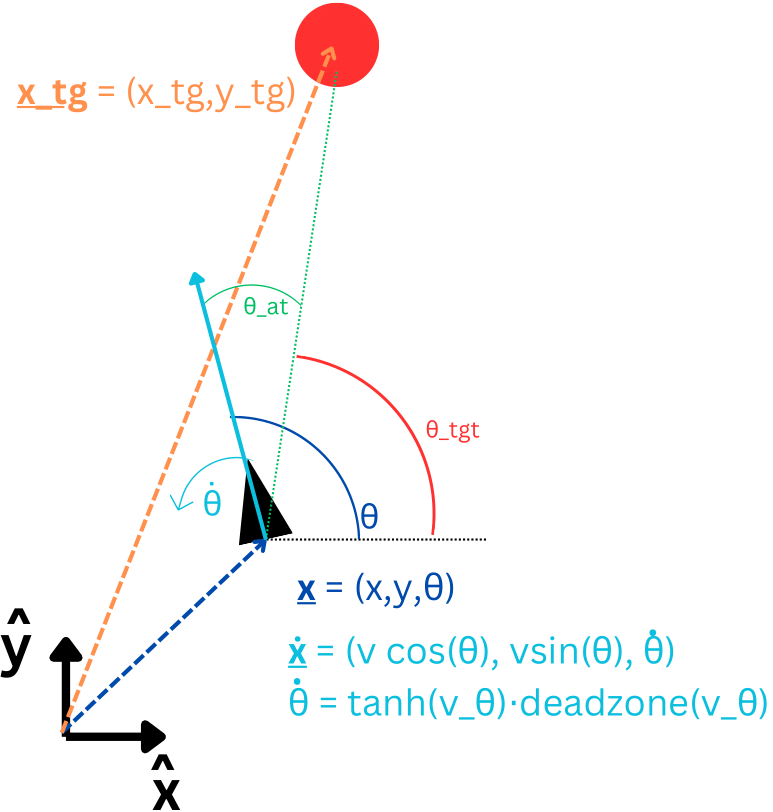

### Graphical interpretation
The unycicle always moves forward with a contant speed $v$. Forward is defined by its angle $\Theta$ relative to the $x$ axis.

The change in the angle $\Theta$ is the only variable that can be controlled through the input $v_\theta$. However, the angle change is not instantaneous as $v_\theta$ is limited by the deadband in how small it can be, and by the scaled saturating function in how large it can be.

In [3]:
Tfinal=100.
tspan=(0.0,Tfinal)

barv = 0.1
vθ0 = 0.5

τ = 0.001
barKvθ = 1.0

obj(t) = [0.0+0.0*sin(2*pi*0*t+0); 10-0.0*t]
xt(t)=[0.0+0.1*(t-80)*(t>80);10-0.1(t-80)*(t>80)]

Coll_Rad = 0.0
Coll_Sens = 1e6

k(t) = 0.0

σθ = 0.001

p=(barv,vθ0,τ,barKvθ,obj,xt,Coll_Rad,Coll_Sens,k,σθ,σθ)

x0=[0.0;0.0;pi/2;0.0]

prob=SDEProblem(unicycle_full!,σ_unicycle_full!,x0,tspan,p)
@time sol=solve(prob,EM(),dt=1e-4,saveat=0.001);



  3.672356 seconds (15.42 M allocations: 962.982 MiB, 4.10% gc time, 80.79% compilation time)


[ Info: Saved animation to C:\Users\aurel\Desktop\uni\m2q2\Brain inspired computing\midterm\exercise1.gif


Plots.AnimatedGif("C:\\Users\\aurel\\Desktop\\uni\\m2q2\\Brain inspired computing\\midterm\\exercise1.gif")
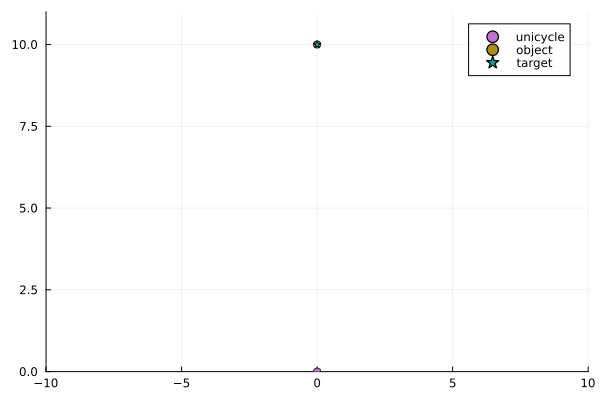

In [4]:
#plot(sol[1,:],sol[2,:],xlims=(-10,10))
objtraj=reduce(hcat,obj.(sol.t))'
#plot!(objtraj[:,1],objtraj[:,2])

tgttraj=reduce(hcat,xt.(sol.t))'

#print(objtraj)
#scatter!(sol[1,1:10000:end],sol[2,1:10000:end])
#scatter!(objtraj[1:10000:end,1],objtraj[1:10000:end,2])
#scatter!(tgttraj[1:10000:end,1],tgttraj[1:10000:end,2])

n = length(sol.t)


anim = @animate for i in 1:1000:n
    plot(sol[1,1:i], sol[2,1:i],xlims=(-10,10), ylims =(0,11), label="")
    plot!(tgttraj[1:i,1], tgttraj[1:i,2], label="")
    plot!(objtraj[1:i,1], objtraj[1:i,2], label="")
    scatter!([sol[1,i]], [sol[2,i]], label="unicycle")
    scatter!([objtraj[i,1]], [objtraj[i,2]], label = "object")
    scatter!([tgttraj[i,1]], [tgttraj[i,2]], label = "target", markershape=:star5)
end
gif(anim, "exercise1.gif", fps = 30)


### Integral controller
The integral term could be encoded as another variable in the controller that accumulates the values of $\theta_{at}$ over time at a speed determined by a time constant $\tau_i$. Its effect would then be added to the proportional part of the controller scaling it by a factor $K_i$.

The resulting equations would be : 

$$
\tau \dot v_\theta = - v_\theta + \tanh\left( -K_{v_\theta}\sin(\theta_{at}(t) - K_i * i_\theta(t)) \right)
$$

$$
\tau_i \dot i_\theta = \theta_{at}(t)
$$



  1.915111 seconds (10.03 M allocations: 686.674 MiB, 5.17% gc time, 64.10% compilation time)


[ Info: Saved animation to C:\Users\aurel\Desktop\uni\m2q2\Brain inspired computing\midterm\exercise1_integrator.gif


Plots.AnimatedGif("C:\\Users\\aurel\\Desktop\\uni\\m2q2\\Brain inspired computing\\midterm\\exercise1_integrator.gif")
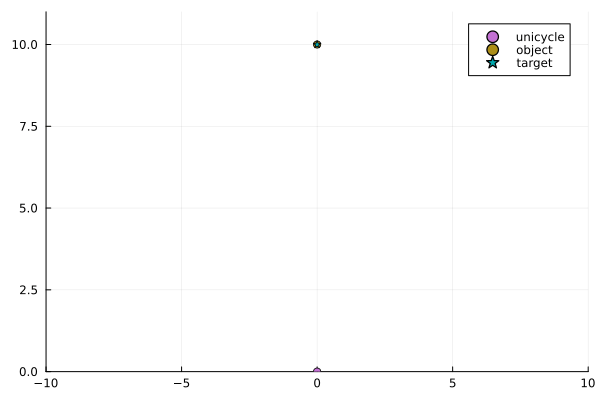

In [5]:
function unicycle_integrator!(du,u,p,t)
    
    barv = p[1]
    
    vθ0 = p[2]
    
    τ = p[3]
    barKvθ = p[4]
    
    obj = p[5]
    xt = p[6]
    
    Coll_Rad = p[7]
    Coll_Sens = p[8]
    
    k = p[9]
    
    x=u[1]
    y=u[2]
    θ=u[3]
    vθ=u[4]
    i =u[5]
    
    a=[1;0] # Orizontal axis
    b=[xt(t)[1]-x;xt(t)[2]-y] #vector from agent to reference
    
    dot = a[1]*b[1] + a[2]*b[2]      # cosine of the angle of the agent-to-ref vector wrt to horizontal axis
    det = a[1]*b[2] - a[2]*b[1]      # sine of the angle of the agent-to-ref vector wrt to horizontal axis
    θt = atan(det, dot)  # angle of the agent-to-ref vector wrt to horizontal axis
    
    θat = θ-θt
    
    c=[obj(t)[1]-x;obj(t)[2]-y] # object position
    dot = a[1]*c[1] + a[2]*c[2]      # cosine of the angle of the object vector wrt to horizontal axis
    det = a[1]*c[2] - a[2]*c[1]      # sine of the angle of the object vector wrt to horizontal axis
    θo = atan(det, dot)  #angle of the object vector wrt to horizontal axis
    
    θao=θ-θo
    #θao=-θo
    
    collision_alert = cos(θao)^2*10^(-(norm(c)-Coll_Rad))*(cos(θao)>0)#*(norm(c-[x;y])<Coll_Rad)
    
    impact_side = sign(sin(θao))
    
    Kvθ(collision_alert) = barKvθ*Coll_Sens/(collision_alert+Coll_Sens)
    
    I = impact_side*collision_alert - Kvθ(collision_alert)*sin(θat) 
    
    kk(t) = k(t)*collision_alert
    
    ki = 1  # unitary integrator gain
    τi = 10 #slow integration
    
    du[1]=barv*cos(θ)
    du[2]=barv*sin(θ)
    du[3]=((vθ<-vθ0)*tanh(vθ)+(vθ>vθ0)*tanh(vθ))
    du[4]=1/τ*( -vθ  + tanh( kk(t)*vθ + I - ki*i) )  
    du[5]= 1/τi *θat
    
end

x0=[0.0;0.0;pi/2;0.0;0.0]

prob=SDEProblem(unicycle_integrator!,σ_unicycle_full!,x0,tspan,p)
@time sol=solve(prob,EM(),dt=1e-4,saveat=0.001);

objtraj=reduce(hcat,obj.(sol.t))'
tgttraj=reduce(hcat,xt.(sol.t))'

n = length(sol.t)
anim = @animate for i in 1:1000:n
    plot(sol[1,1:i], sol[2,1:i],xlims=(-10,10), ylims =(0,11), label="")
    plot!(tgttraj[1:i,1], tgttraj[1:i,2], label="")
    plot!(objtraj[1:i,1], objtraj[1:i,2], label="")
    scatter!([sol[1,i]], [sol[2,i]], label="unicycle")
    scatter!([objtraj[i,1]], [objtraj[i,2]], label = "object")
    scatter!([tgttraj[i,1]], [tgttraj[i,2]], label = "target", markershape=:star5)
end
gif(anim, "exercise1_integrator.gif", fps = 30)

## Exercise 2. Reaching in the presence of moving objects.

We now include the presence of moving objects on the plane and assume that the unicycle agent can avoid those objects by measuring their relative position. However, moving objects become detectable only when sufficiently close to the unicycle.

We start with a single moving objects with position $\mathbf{x}_{obj}=(x_{obj}(t),y_{obj}(t))$ that's heading straight toward the unicycle between the unicycle and the target. In particular, we let
$$
x_{obj}(t) = 0.0,\quad y_{obj}(t)=10-0.1t
$$

The obstacle avoidance control system works by reducing the gain with which the unicycle tracks the target and by simultaneously steering away from the object. Let $\theta_{ao}(t)$ be the visual angle of the object in the reference of the agent, i.e., $\theta_{ao}(t)=\theta(t)-\theta_{obj}(t)$ and $\theta_{obj}(t)$ is the angle between the vector $\mathbf{x}_{obj}-\mathbf{x}$ and the $x$ axis. The proposed control dynamics with collision avoidance mechanism are

$$
\tau \dot v_\theta = - v_\theta + \tanh\left( -K_{v_\theta}(C_A)\cdot\sin(\theta_{at}(t)) + I_S\cdot C_A \right)
$$

where

$$
C_A = C_A(\mathbf{x}-\mathbf{x}_{obj})= \left\{
\begin{array}{ll}
  \cos(\theta_{ao})^2\cdot 10^{-(\|\mathbf{x}-\mathbf{x}_{obj}\|-C_R)} &
\mbox{if } \cos(\theta_{ao})>0\\
0 &
\mbox{if } \cos(\theta_{ao})\leq 0
\end{array}
\right.,\quad C_R\geq 0,
$$
is the **collision alert**,
$$
I_S=I_S(\theta_{ao})=\mbox{sign}(\sin(\theta_{ao}))
$$
is the **impact side**, and
$$
K_{v_\theta}(C_A) = \bar K_{v_\theta}\frac{C_S}{C_S+C_A},\quad C_S>0,
$$
is the **collision alert-dependening tracking gain**. The parameters $C_R$ and $C_S$ are the **collision-avoidance radius** and **collision-avoidance sensitivity**, respectively. The collision avoidance radius is the characteristic spatial scale at which the agent stops tracking the target and starts focusing on avoiding the object.

* Encode the model with the collision avoidance system and interpret it geometrically.

* Simulate it for $C_R=1.0$ and $C_S=0.01$ and all other parameter fixed as above.

* Produce a plot that reports the minimum distance between the object and the target along the trajectory (averaged over 10 repetitions) as a function of $C_R\in(0,1]$ and all other paramter fixed.

* Quantify the amount of controlled used for the obstacle avoidance and plot it as a function of $C_R\in(0,1]$ and all other paramter fixed.

* Draw a bifurcation diagram of the controller equilibria as a function of $\|\bf{x}-\bf{x}_{obj}\|$ and for $\theta_{ao}=0.001$, $\theta_{at}=0$, $C_R=0.1,0.25,0.5,1.0$ and all other parameters as above.


In [6]:
Tfinal=100.
tspan=(0.0,Tfinal)

barv = 0.1
vθ0 = 0.5

τ = 0.001
barKvθ = 1.0

obj(t) = [0.0+0.0*sin(2*pi*0*t+0); 10-0.1*t]
xt(t)=[0.0+0.1*(t-80)*(t>80);10-0.1(t-80)*(t>80)]

Coll_Rad = 1.0
Coll_Sens = 0.01

k(t) = 10.0

σx = 0.001
σθ = 0.001

p=(barv,vθ0,τ,barKvθ,obj,xt,Coll_Rad,Coll_Sens,k,σx,σθ)

x0=[0.0;0.0;pi/2;0.0]

prob=SDEProblem(unicycle_full!,σ_unicycle_full!,x0,tspan,p)
@time sol=solve(prob,EM(),dt=1e-4,saveat=0.001);



  1.880194 seconds (8.73 M allocations: 625.290 MiB, 4.96% gc time, 59.62% compilation time: 100% of which was recompilation)


### Geometric interpretation 

The addition of $I_S\cdot C_A$ adds object detection to the control input in two ways. First, by determining the side on which the object is located in relation to the unicycle with $I_S$:

$
I_S=I_S(\theta_{ao})=\mbox{sign}(\sin(\theta_{ao}))
$

The sine of the difference angle $\theta_{ao}$ will give a positive result if the angle of the unicycle is larger than the angle of the object in relation to the x-axis, indicating that the object is on the right of the unicycle. To increase this angle and avoid the object, the unicycle should turn in the same direction as it is compared to the object.

Then, $C_A$ determines the strength of the response. If the unicycle is already perpendicular or moving in the same direction as the object, it should not change course ($0$ if $\cos(\theta_{ao})\leq 0$). Otherwise, the change in course should be proportional to how close the angle between them is to being perpendicular ($\cos(\theta_{ao})^2$) and exponentially inversely proportional to the distance between the unicycle and the object plus a collision avoidance padding distance ($\cdot 10^{-(|\mathbf{x}-\mathbf{x}_{obj}|-C_R)}$).

Finally, we can see how $-K_{v_\theta}(C_A)$ has been modified to switch between the strength of the two objectives. When $C_A$ is large compared to $C_s$, $K_{v_\theta}$ is small to increase the effect of the object avoidance part of the control. Otherwise, $K_{v_\theta}$ is large in absolute value, and the main objective of moving towards the target by reducing $\theta_{at}$ overpowers the other control signal.


### Simulation with $C_R = 1 $ and $C_S = 0.01 $

  2.204089 seconds (10.30 M allocations: 700.616 MiB, 5.24% gc time, 69.23% compilation time)


[ Info: Saved animation to C:\Users\aurel\Desktop\uni\m2q2\Brain inspired computing\midterm\exercise2_simulation1.gif


Plots.AnimatedGif("C:\\Users\\aurel\\Desktop\\uni\\m2q2\\Brain inspired computing\\midterm\\exercise2_simulation1.gif")
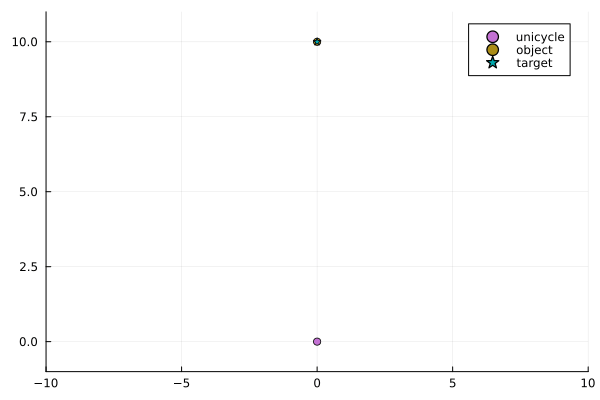

In [7]:
p=(barv,vθ0,τ,barKvθ,obj,xt,1,0.01,k,σx,σθ)

x0=[0.0;0.0;pi/2;0.0]

prob=SDEProblem(unicycle_full!,σ_unicycle_full!,x0,tspan,p)
@time sol=solve(prob,EM(),dt=1e-4,saveat=0.001);

objtraj=reduce(hcat,obj.(sol.t))'
tgttraj=reduce(hcat,xt.(sol.t))'

n = length(sol.t)
anim = @animate for i in 1:1000:n
    plot(sol[1,1:i], sol[2,1:i],xlims=(-10,10), ylims =(-1,11), label="")
    plot!(tgttraj[1:i,1], tgttraj[1:i,2], label="")
    plot!(objtraj[1:i,1], objtraj[1:i,2], label="")
    scatter!([sol[1,i]], [sol[2,i]], label="unicycle")
    scatter!([objtraj[i,1]], [objtraj[i,2]], label = "object")
    scatter!([tgttraj[i,1]], [tgttraj[i,2]], label = "target", markershape=:star5)
end
gif(anim, "exercise2_simulation1.gif", fps = 30)


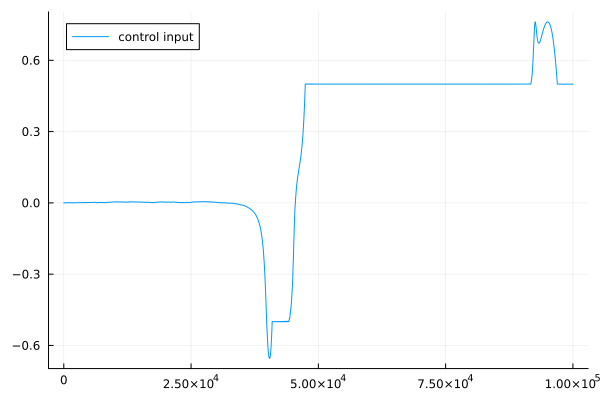

In [8]:
plot(sol[4,:], label = " control input")


### Minimum distance between object and target allong the trajectory as a function of $C_R$ and $C_S = 0.001$

    Updating registry at `C:\Users\aurel\.julia\registries\General.toml`
   Resolving package versions...
  No Changes to `C:\Users\aurel\.julia\environments\v1.8\Project.toml`
  No Changes to `C:\Users\aurel\.julia\environments\v1.8\Manifest.toml`
Progress: 100%|█████████████████████████████████████████| Time: 0:01:12


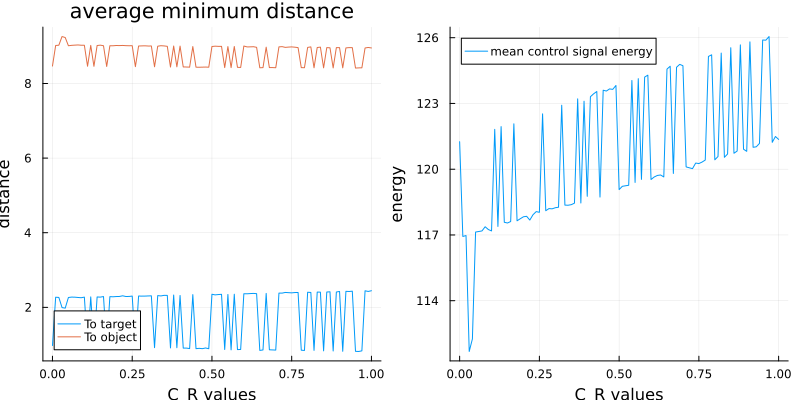

In [9]:
Pkg.add("ProgressMeter")
using Statistics
using ProgressMeter

av_min_distances_tgt = zeros(0)
av_min_distances_obj = zeros(0)
av_energy_of_control = zeros(0)
x0=[0.0;0.0;pi/2;0.0]

cr_values = 0:0.01:1
nb_repetitions = 10
@showprogress 1 for CR in cr_values
    min_distances_tgt = zeros(0)
    min_distances_obj = zeros(0)
    energy_of_control = zeros(0)
    
    p=(barv,vθ0,τ,barKvθ,obj,xt,CR,Coll_Sens,k,σx,σθ)
    prob=SDEProblem(unicycle_full!,σ_unicycle_full!,x0,tspan,p)  
    
    for r in nb_repetitions
        sol=solve(prob,EM(),dt=1e-4,saveat=0.001);
        
        distances = zeros(0)
        #distance to target
        for t_step in length(sol.t)

            distance = norm(sol[1:2,t_step] - tgttraj[t_step,:])
            push!(distances,distance)
        end
        push!(min_distances_tgt,(minimum(distances)))
        
        distances = zeros(0)
        #distance to object
        for t_step in length(sol.t)
            distance = norm(sol[1:2,t_step] - objtraj[t_step,:])
            push!(distances,distance)
        end
        push!(min_distances_obj,minimum(distances))
        
        #energy of control signal
        push!(energy_of_control, norm(sol[4,:]))
        
    end
    
    push!(av_min_distances_tgt,mean(min_distances_tgt))
    push!(av_min_distances_obj,mean(min_distances_obj))
    push!(av_energy_of_control,mean(energy_of_control))
end
    
p1 = plot(cr_values,[av_min_distances_tgt av_min_distances_obj],label = ["To target" "To object"], xlabel= "C_R values",ylabel = "distance", title = "average minimum distance" )
p2 = plot(cr_values,av_energy_of_control,label = "mean control signal energy", xlabel= "C_R values",ylabel = "energy" )
plot(p1,p2,size=(800,400))

[ Info: Saved animation to C:\Users\aurel\Desktop\uni\m2q2\Brain inspired computing\midterm\anim_flex_coll_rad1.0-k10.0.gif


Plots.AnimatedGif("C:\\Users\\aurel\\Desktop\\uni\\m2q2\\Brain inspired computing\\midterm\\anim_flex_coll_rad1.0-k10.0.gif")
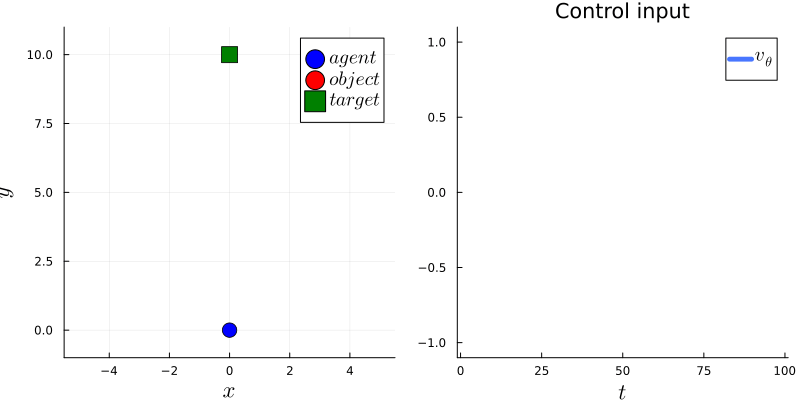

In [10]:
gr(legendfontsize=13,labelfontsize=15)

anim = @animate for i = 1:1000:length(sol.t)
    p1=plot(xlims=(-5.5,5.5))
    #objtraj=reduce(hcat,obj.(sol.t))'
    #plot!(objtraj[1:i,1],objtraj[1:i,2])

    #tgttraj=reduce(hcat,xt.(sol.t))'

    #scatter_steps = 10000
    scatter!([sol[1,i]],[sol[2,i]],mc=:blue,label=L"agent",ms=8.0)
    scatter!([objtraj[i,1]],[objtraj[i,2]],mc=:red,label=L"object",ms=8.0)
    scatter!([tgttraj[i,1]],[tgttraj[i,2]],mc=:green,label=L"target",ms=8.0,m=:square)
    plot!(ylims=(-1,11))
    plot!(xlabel=L"x",ylabel=L"y")
    p2=plot(sol.t[1:i],sol[4,1:i],grid=false,lw=3,lc=:RoyalBlue1,
            xlims=(-1,101),ylims=(-1.1,1.1),labels=L"v_\theta",xlabel=L"t",title="Control input")
    plot(p1,p2,size=(800,400))
end
k0=k(0.01)
gif(anim, "anim_flex_coll_rad$Coll_Rad-k$k0.gif", fps = 10)
#savefig("anim_flex_coll_rad$Coll_Rad-k$k0.gif")

### Biffurcation diagram

   Resolving package versions...
  No Changes to `C:\Users\aurel\.julia\environments\v1.8\Project.toml`
  No Changes to `C:\Users\aurel\.julia\environments\v1.8\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\aurel\.julia\environments\v1.8\Project.toml`
  No Changes to `C:\Users\aurel\.julia\environments\v1.8\Manifest.toml`


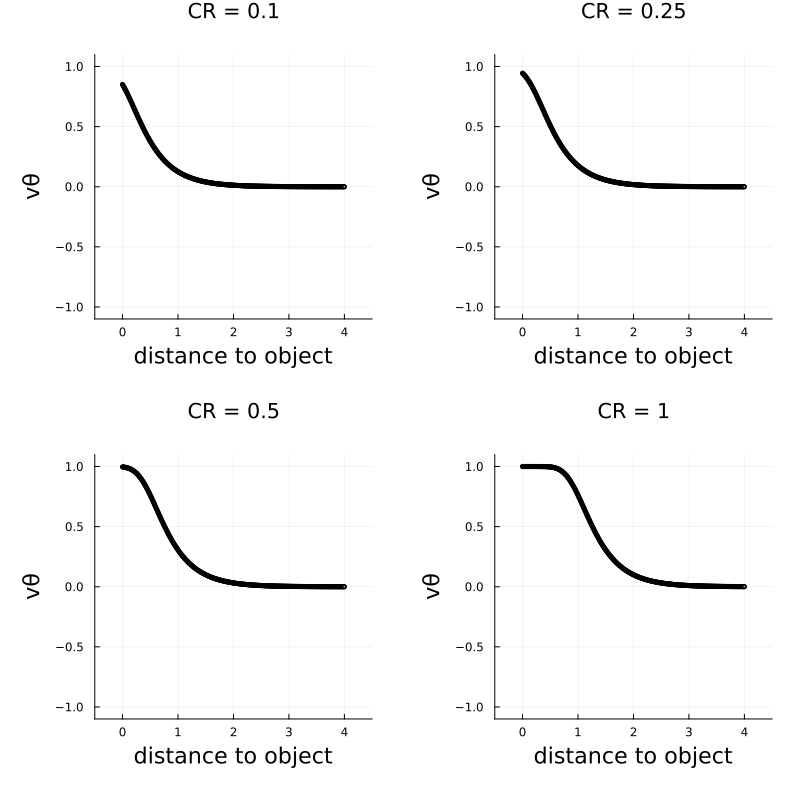

In [11]:
Pkg.add("Roots")
Pkg.add(["IntervalArithmetic", "IntervalRootFinding"])
using Roots
using IntervalArithmetic, IntervalRootFinding

function controller_bifurcation_diagram( CR = 0.1, k = 0, θao = 0.001, θat = 0.0)
    
    function controller(vθ,c)
        barKvθ = 1.0
        Coll_Sens = 0.01
        
        collision_alert = cos(θao)^2*10^(-(c-CR))*(cos(θao)>0)
        impact_side = sign(sin(θao))

        Kvθ = barKvθ*Coll_Sens/(collision_alert+Coll_Sens)
        kk = k*collision_alert
        I = impact_side*collision_alert - Kvθ*sin(θat) 
        return -vθ  + tanh(kk*vθ + I )
    end
    
    distance_vals = 0:0.01:4
    p = scatter(3, xlims=(-0.5,4.5), ylims =(-1.1,1.1),label="" ,xlabel = "distance to object", ylabel = "vθ", title = "CR = $CR")
    for dist in distance_vals
        f = (x -> controller(x, dist))
        fixed_pts = roots(f,-3..3)
        midpoints = mid.(interval.(fixed_pts))
        #println(size(midpoints))
        for i in midpoints
            scatter!([dist],[i],label="",fc="LightSkyBlue",markersize = 2)
        end
    end
    return p
end

p1 = controller_bifurcation_diagram(0.1)
p2 = controller_bifurcation_diagram(0.25)
p3 = controller_bifurcation_diagram(0.5)
p4 = controller_bifurcation_diagram(1)

plot(p1,p2,p3,p4,size=(800,800),margin=20px)


## Exercise 3. Using flexible representations to rapidly avoid obstacles

We now introduce a positive feedback term into the controller equations to enhance its sensitivity in the presence of close obstacles.

In particular, we let
$$
\tau \dot v_\theta = - v_\theta + \tanh\left( k\cdot C_A\cdot v_\theta -K_{v_\theta}(C_A)\cdot\sin(\theta_{at}(t)) + I_S\cdot C_A \right),\quad k\geq 0,
$$
that is, we let the positive feedback gain grow linearly with the collision alert variable.

* Encode the model with the collision alert-dependent positive feedback and simulate it for $C_R=1.0$, $C_S=0.01$, $k=1.0,2.0,3.0$ and all other parameter fixed as above.

* Produce three plots that report the minimum distance between the object and the target along the trajectory (averaged over 10 repetitions) as a function of $C_R\in(0,1]$ and for $k=1.0,5.0,10.0$, and all other paramter fixed.

* Quantify the amount of control used for the obstacle avoidance and plot it as a function of $C_R\in(0,1]$ and for $k=1.0,5.0,10.0,20.0$, and all other parameter fixed as above.

* Draw a bifurcation diagram of the controller equilibria as a function of $\|\bf{x}-\bf{x}_{obj}\|$ and for $\theta_{ao}=0.001$, $\theta_{at}=0$, $C_R=0.1,0.25,0.5,1.0$, $k=1.0,5.0,10.0$, and all other parameters as above.

* Compare the performance with and without collision alert-dependent positive feedback and interpret the results in terms of the computed bifurcation diagrams.

### Simulations with k = 1, 2, 3

In [12]:
Cr = 1.0
Cs = 0.01
x0=[0.0;0.0;pi/2;0.0]

for val in 1:1:3
    k(t)=val
    pars=(barv,vθ0,τ,barKvθ,obj,xt,Cr,Cs,k,σx,σθ)
    
    prob=SDEProblem(unicycle_full!,σ_unicycle_full!,x0,tspan,pars)
    @time sol=solve(prob,EM(),dt=1e-4,saveat=0.001);

    objtraj=reduce(hcat,obj.(sol.t))'
    tgttraj=reduce(hcat,xt.(sol.t))'

    n = length(sol.t)
    anim = @animate for i in 1:1000:n
        plot(sol[1,1:i], sol[2,1:i],xlims=(-10,10), ylims =(-1,11), label="",title= "positive feedback k = $val")
        plot!(tgttraj[1:i,1], tgttraj[1:i,2], label="")
        plot!(objtraj[1:i,1], objtraj[1:i,2], label="")
        scatter!([sol[1,i]], [sol[2,i]], label="unicycle")
        scatter!([objtraj[i,1]], [objtraj[i,2]], label = "object")
        scatter!([tgttraj[i,1]], [tgttraj[i,2]], label = "target", markershape=:star5)
    end
    gif(anim, "exercise3_simulation$val.gif", fps = 30)
end


  1.754234 seconds (8.71 M allocations: 624.337 MiB, 7.96% gc time, 58.72% compilation time: 99% of which was recompilation)


[ Info: Saved animation to C:\Users\aurel\Desktop\uni\m2q2\Brain inspired computing\midterm\exercise3_simulation1.gif


  1.781589 seconds (8.71 M allocations: 623.824 MiB, 3.61% gc time, 61.70% compilation time: 100% of which was recompilation)
  1.704744 seconds (8.71 M allocations: 624.062 MiB, 5.82% gc time, 58.50% compilation time: 100% of which was recompilation)

[ Info: Saved animation to C:\Users\aurel\Desktop\uni\m2q2\Brain inspired computing\midterm\exercise3_simulation2.gif


[ Info: Saved animation to C:\Users\aurel\Desktop\uni\m2q2\Brain inspired computing\midterm\exercise3_simulation3.gif


### Minimum distance of object and enrgy of control signal as a function of CR for K = 1 , 5 , 10 ,20

Progress: 100%|█████████████████████████████████████████| Time: 0:01:13


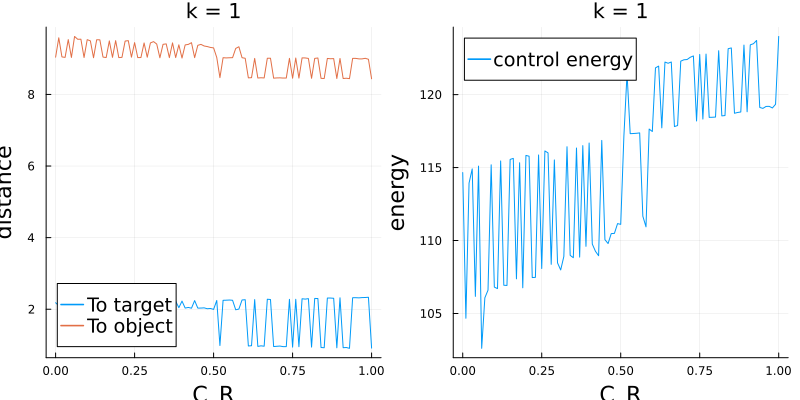

Progress: 100%|█████████████████████████████████████████| Time: 0:01:11


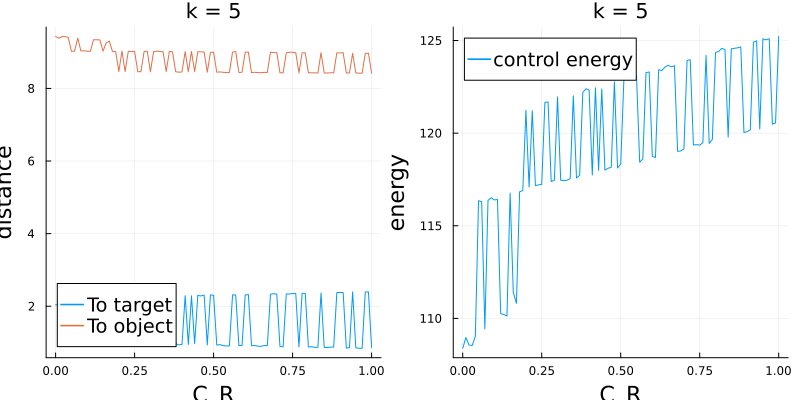

Progress: 100%|█████████████████████████████████████████| Time: 0:01:11


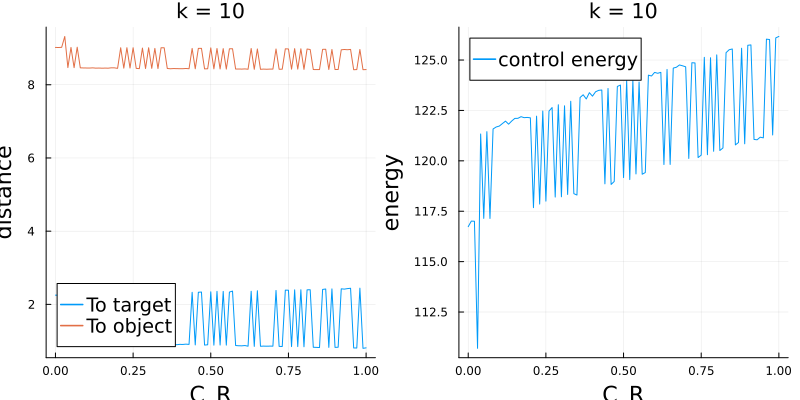

Progress: 100%|█████████████████████████████████████████| Time: 0:01:11


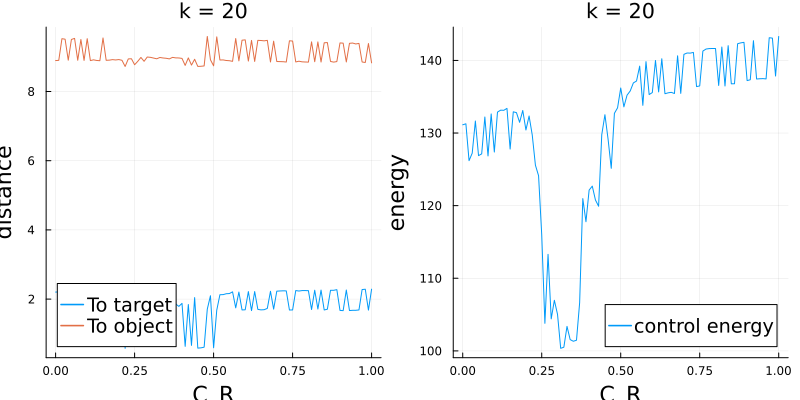

In [13]:
x0=[0.0;0.0;pi/2;0.0]
Cs = 0.01

cr_values = 0:0.01:1
K_values  = [1, 5 , 10 ,20]
nb_repetitions = 10

for val in K_values
    
    av_min_distances_tgt = zeros(0)
    av_min_distances_obj = zeros(0)
    av_energy_of_control = zeros(0)

    k(t) = val
    @showprogress 1 for CR in cr_values
        min_distances_tgt = zeros(0)
        min_distances_obj = zeros(0)
        energy_of_control = zeros(0)
        
        p=(barv,vθ0,τ,barKvθ,obj,xt,CR,Cs,k,σx,σθ)
        prob=SDEProblem(unicycle_full!,σ_unicycle_full!,x0,tspan,p)  

        for r in nb_repetitions
            sol=solve(prob,EM(),dt=1e-4,saveat=0.001);

            distances = zeros(0)
            #distance to target
            for t_step in length(sol.t)

                distance = norm(sol[1:2,t_step] - tgttraj[t_step,:])
                push!(distances,distance)
            end
            push!(min_distances_tgt,(minimum(distances)))

            distances = zeros(0)
            #distance to object
            for t_step in length(sol.t)
                distance = norm(sol[1:2,t_step] - objtraj[t_step,:])
                push!(distances,distance)
            end
            push!(min_distances_obj,minimum(distances))

            #energy of control signal
            push!(energy_of_control, norm(sol[4,:]))
        end

        push!(av_min_distances_tgt,mean(min_distances_tgt))
        push!(av_min_distances_obj,mean(min_distances_obj))
        push!(av_energy_of_control,mean(energy_of_control))
    end

    p1 = plot(cr_values,[av_min_distances_tgt av_min_distances_obj],label = ["To target" "To object"], xlabel= "C_R",ylabel = "distance" )
    p2 = plot(cr_values,av_energy_of_control,label = "control energy", xlabel= "C_R",ylabel = "energy" )
    display(plot(p1,p2,size=(800,400), title = "k = $val"))
end

### Bifurcation diagrams with 𝐶𝑅=0.1,0.25,0.5,1.0, 𝑘=1.0,5.0,10.0

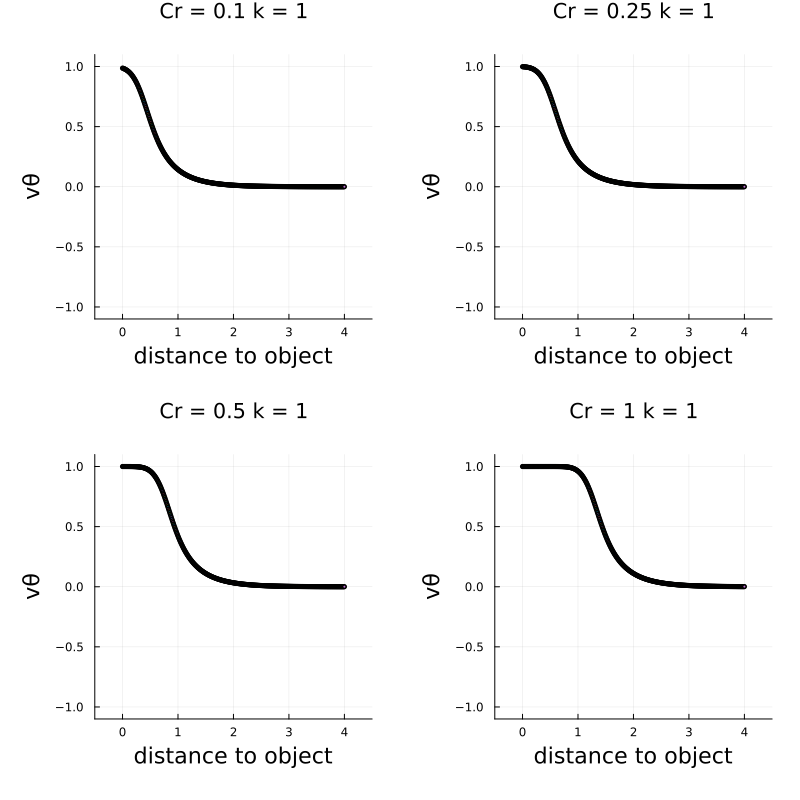

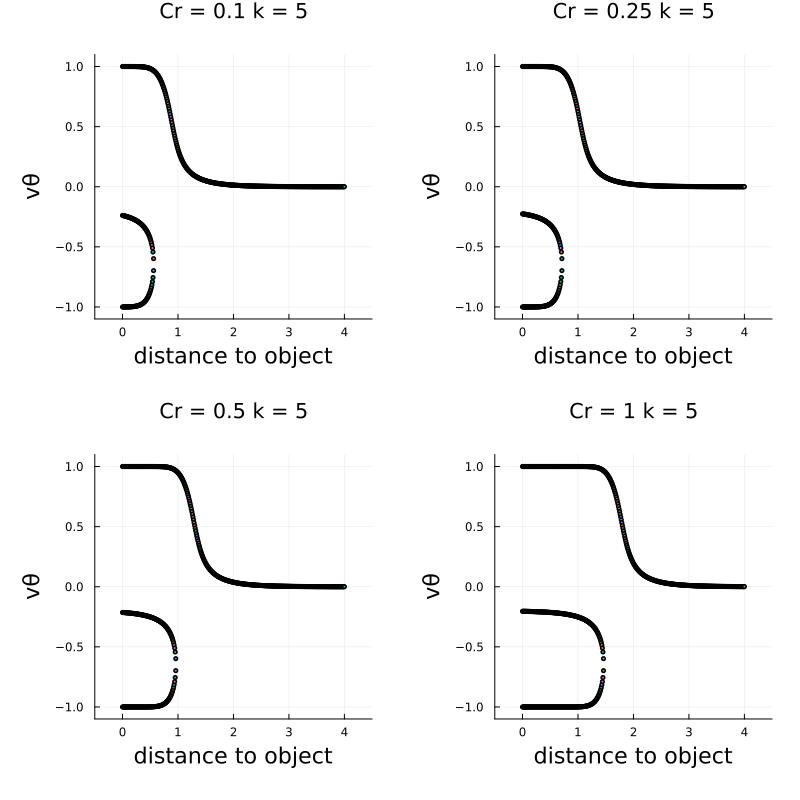

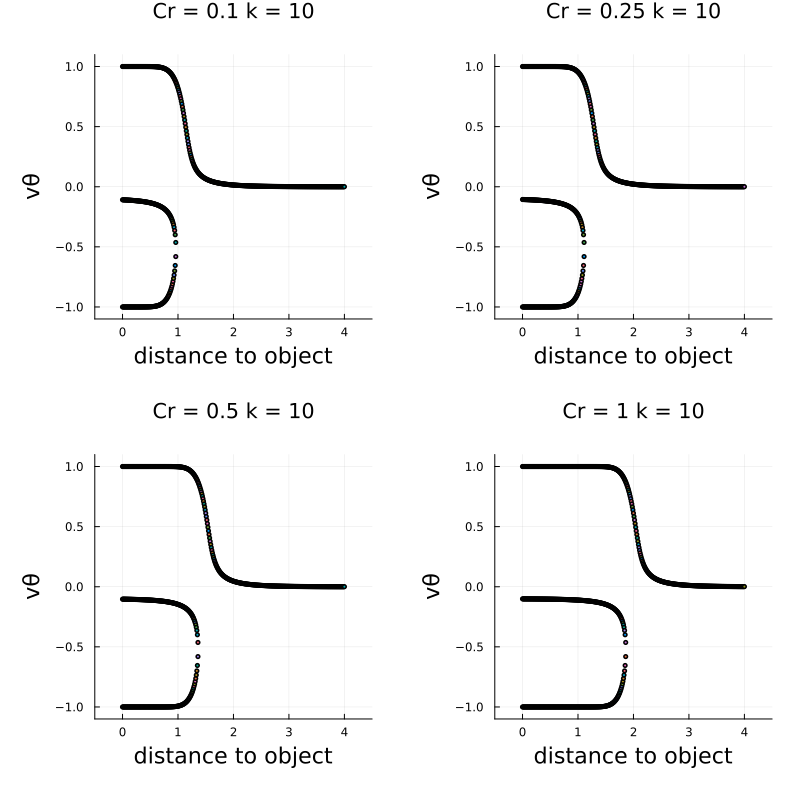

In [14]:
K_values  = [1, 5 , 10]
for val in K_values
    p1 = controller_bifurcation_diagram( 0.1, val)
    title!("Cr = 0.1 k = $val")
    p2 = controller_bifurcation_diagram( 0.25, val)
    title!("Cr = 0.25 k = $val")
    p3 = controller_bifurcation_diagram( 0.5, val)
    title!("Cr = 0.5 k = $val")
    p4 = controller_bifurcation_diagram( 1, val)
    title!("Cr = 1 k = $val")
    
    display(plot(p1,p2,p3,p4,size=(800,800),margin=20px))
end

### Performance interpretation with and without collision alert-dependent positive feedback

As it can be seen in the minimum distance to object and target plots, tracking performance is similar in the implementations of the controller with and without positive feedback. However, the control signal energy plot shows that the alert-dependent positive feedback is the most efficient of the two.

Using the biffurcation diagrams we can see that the addition of the collision alert-dependent positive feedback creates a pitchfork bifurcation(biased in this case due to $𝜃𝑎𝑜=0.001$). Increasing the positive feedback factor $k$ makes the pitchfork more aprubt. It also makes the bifurcation take place at a larger distance from the object. This reflects the higher sensitivity to the object distance which slightly increases the minimum distance to the object and improves the object avoidance as it can be seen in the minimum distance plots.

## Exercise 4. Excitable unicycle control

Finally, we introduce state-dependent positive feedback in the controller dynamics and slow adaptation to make it excitable.

In particular, we let
\begin{align*}
\tau \dot v_\theta &= - v_\theta + \tanh\left( (k\cdot C_A + K_{v_\theta^2} v_\theta^2-k_s)\cdot v_\theta -K_{v_\theta}(C_A)\cdot\sin(\theta_{at}(t)) + I_S\cdot C_A \right),\quad k\geq 0,\\
\dot k_s&=\varepsilon\left((K\cdot v_\theta)^4-k_s\right)
\end{align*}
We also assume that at each control spike, the angle dynamics receives a stronger impulse as compared to the non-excitable case:
$$
\dot\theta = \tanh(v_\theta)\times\left\{\begin{array}{ll}
1 & \mbox{if }v_\theta<-v_{\theta,0}\\
0 & \mbox{if }-v_{\theta,0}<v_\theta<v_{\theta,0}\\
1 & \mbox{if }v_\theta>v_{\theta,0}
\end{array}
\right.
$$

* Encode the model with the collision alert-dependent positive feedback and simulate it for $C_R=1.0$, $C_S=0.01$, $k=1.0,5.0,10.0$, $K_{v_\theta^2}=5.0$, $\varepsilon=10.0$, $K=1.5$, and all other parameter fixed as above.

* Produce three plots that report the minimum distance between the object and the target along the trajectory (averaged over 10 repetitions) as a function of $C_R\in(0,1]$ and for $k=1.0,5.0,10.0$, and all other paramter fixed.

* Quantify the amount of control used for the obstacle avoidance and plot it as a function of $C_R\in(0,1]$ and for $k=1.0,5.0,10.0$, and all other parameter fixed as above.

* Draw a bifurcation diagram of the controller equilibria and limit cycles as a function of $\|\bf{x}-\bf{x}_{obj}\|$ and for $\theta_{ao}=0.001$, $\theta_{at}=0$, $C_R=0.1,0.25,0.5,1.0$, $k=1.0,5.0,10.0$, and all other parameters as above. Draw $(k_s,v_\theta)$ phase planes for representative values of $\|\bf{x}-\bf{x}_{obj}\|$ and other paramters.

* Compare the performance with the non-excitable controller and use the bifurcation and phase plane analysis to explain the results.

In [15]:
function unicycle_full_exc!(du,u,p,t)
    
    barv = p[1]
    
    vθ0 = p[2]
    
    τ = p[3]
    barKvθ = p[4]
    
    obj = p[5]
    xt = p[6]
    
    Coll_Rad = p[7]
    Coll_Sens = p[8]
    
    k = p[9]
    
    Kx = p[12]
    K = p[13]
    ε = p[14]
    
    x=u[1]
    y=u[2]
    θ=u[3]
    vθ=u[4]
    ks=u[5]
    
    a=[1;0] # Orizontal axis
    b=[xt(t)[1]-x;xt(t)[2]-y] #vector from agent to reference
    
    dot = a[1]*b[1] + a[2]*b[2]      # cosine of the angle of the agent-to-ref vector wrt to horizontal axis
    det = a[1]*b[2] - a[2]*b[1]      # sine of the angle of the agent-to-ref vector wrt to horizontal axis
    θt = atan(det, dot)  # angle of the agent-to-ref vector wrt to horizontal axis
    
    θat = θ-θt
    
    c=[obj(t)[1]-x;obj(t)[2]-y] # object position
    dot = a[1]*c[1] + a[2]*c[2]      # cosine of the angle of the object vector wrt to horizontal axis
    det = a[1]*c[2] - a[2]*c[1]      # sine of the angle of the object vector wrt to horizontal axis
    θo = atan(det, dot)  #angle of the object vector wrt to horizontal axis
    
    θao=θ-θo
    #θao=-θo
    
    collision_alert = cos(θao)^2*10^(-(norm(c)-Coll_Rad))*(cos(θao)>0)#*(norm(c-[x;y])<Coll_Rad)
    
    impact_side = sign(sin(θao))
    
    Kvθ(collision_alert) = barKvθ*Coll_Sens/(collision_alert+Coll_Sens)
    
    I = impact_side*collision_alert - Kvθ(collision_alert)*sin(θat) 
    
    kk(t) = k(t)*collision_alert
    
    du[1]=barv*cos(θ)
    du[2]=barv*sin(θ)
    du[3]=1*((vθ<-vθ0)*tanh(vθ)+(vθ>vθ0)*tanh(vθ))
    du[4]=1/τ*( -vθ  + tanh( (kk(t)-ks+Kx*vθ^2)*vθ + I ) )  
    du[5]=ε*((K*vθ)^4-ks)
end

function σ_unicycle_full_exc!(du,u,p,t)
    
    du[1] = p[10]
    du[2] = p[10]
    du[3] = p[11]
    du[4] = 0.0
    du[5] = 0.0
    
end

σ_unicycle_full_exc! (generic function with 1 method)

In [16]:
Tfinal=100.
tspan=(0.0,Tfinal)

barv = 0.1
vθ0 = 0.5

τ = 0.001
barKvθ = 1.0

obj(t) = [0.0+0.1*sin(2*pi*0*t+0); 10-0.1*t]
xt(t)=[0.0+0.1*(t-80)*(t>80);10-0.1(t-80)*(t>80)]

Coll_Rad = 1
Coll_Sens = 0.01

k(t) = 10.0

σx = 0.001
σθ = 0.001

Kx = 5.0
K = 1.5
ε = 10.0

p=(barv,vθ0,τ,barKvθ,obj,xt,Coll_Rad,Coll_Sens,k,σx,σθ,Kx,K,ε)

x0=[0.0;0.0;pi/2;0.0;0.0]

prob=SDEProblem(unicycle_full_exc!,σ_unicycle_full_exc!,x0,tspan,p)
@time sol=solve(prob,EM(),dt=1e-4,saveat=0.001);



  2.205041 seconds (10.37 M allocations: 705.124 MiB, 2.53% gc time, 69.07% compilation time)


In [17]:
plot(sol[1,:],sol[2,:],xlims=(-10,10))
objtraj=reduce(hcat,obj.(sol.t))'
plot!(objtraj[:,1],objtraj[:,2])

tgttraj=reduce(hcat,xt.(sol.t))'

scatter_steps = 10000

scatter!(sol[1,1:scatter_steps:end],sol[2,1:scatter_steps:end],mc=cgrad([:blue, :yellow])[sol.t[1:scatter_steps:end]/sol.t[end]])
scatter!(objtraj[1:scatter_steps:end,1],objtraj[1:scatter_steps:end,2],mc=cgrad([:blue, :yellow])[sol.t[1:scatter_steps:end]/sol.t[end]])
scatter!(tgttraj[1:scatter_steps:end,1],tgttraj[1:scatter_steps:end,2])
plot!(ylims=(-1,11))

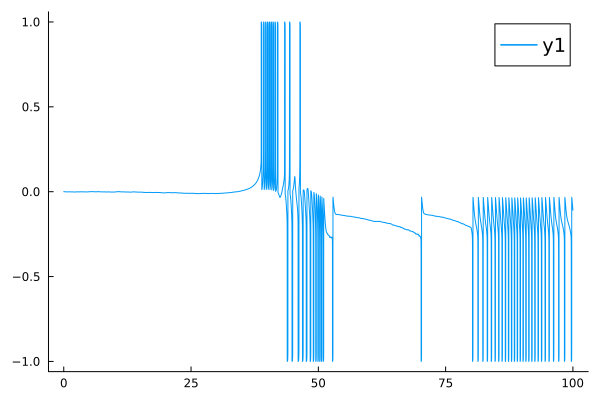

In [18]:
plot(sol.t,sol[4,:],grid=false)


### simulate for 𝑘=1.0,5.0,10.0

In [19]:
x0=[0.0;0.0;pi/2;0.0;0.0]

k_vals = [1,5,10]
Coll_Rad = 1
Coll_Sens = 0.01
Kx = 5.0
K = 1.5
ε = 10.0

for val in k_vals
    
    k(t)=val
    p=(barv,vθ0,τ,barKvθ,obj,xt,Coll_Rad,Coll_Sens,k,σx,σθ,Kx,K,ε)
      
    prob=SDEProblem(unicycle_full_exc!,σ_unicycle_full_exc!,x0,tspan,p)
    @time sol=solve(prob,EM(),dt=1e-4,saveat=0.001);

    objtraj=reduce(hcat,obj.(sol.t))'
    tgttraj=reduce(hcat,xt.(sol.t))'

    n = length(sol.t)
    anim = @animate for i in 1:1000:n
        plot(sol[1,1:i], sol[2,1:i],xlims=(-10,10), ylims =(-1,11), label="",title= "k = $val")
        plot!(tgttraj[1:i,1], tgttraj[1:i,2], label="")
        plot!(objtraj[1:i,1], objtraj[1:i,2], label="")
        scatter!([sol[1,i]], [sol[2,i]], label="unicycle")
        scatter!([objtraj[i,1]], [objtraj[i,2]], label = "object")
        scatter!([tgttraj[i,1]], [tgttraj[i,2]], label = "target", markershape=:star5)
    end
    gif(anim, "exercise4_simulation_k$val.gif", fps = 30)
end

  1.922571 seconds (8.71 M allocations: 624.103 MiB, 5.72% gc time, 59.42% compilation time: 100% of which was recompilation)


[ Info: Saved animation to C:\Users\aurel\Desktop\uni\m2q2\Brain inspired computing\midterm\exercise4_simulation_k1.gif


  1.867624 seconds (8.72 M allocations: 624.395 MiB, 2.67% gc time, 63.14% compilation time: 100% of which was recompilation)


[ Info: Saved animation to C:\Users\aurel\Desktop\uni\m2q2\Brain inspired computing\midterm\exercise4_simulation_k5.gif


  1.948540 seconds (8.71 M allocations: 624.157 MiB, 4.80% gc time, 60.48% compilation time: 100% of which was recompilation)


[ Info: Saved animation to C:\Users\aurel\Desktop\uni\m2q2\Brain inspired computing\midterm\exercise4_simulation_k10.gif


[ Info: Saved animation to C:\Users\aurel\Desktop\uni\m2q2\Brain inspired computing\midterm\anim_exc_coll_rad1-k10.gif


Plots.AnimatedGif("C:\\Users\\aurel\\Desktop\\uni\\m2q2\\Brain inspired computing\\midterm\\anim_exc_coll_rad1-k10.gif")
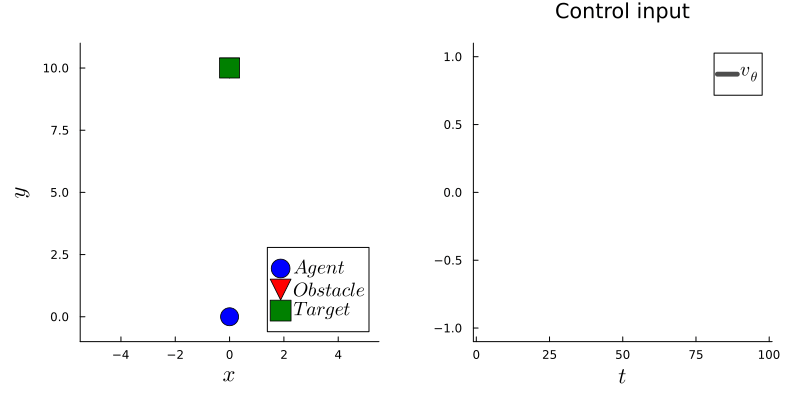

In [20]:
gr(legendfontsize=13,labelfontsize=15)

anim = @animate for i = 1:1000:length(sol.t)
    p1=plot(xlims=(-5.5,5.5))
    #objtraj=reduce(hcat,obj.(sol.t))'
    #plot!(objtraj[1:i,1],objtraj[1:i,2])

    #tgttraj=reduce(hcat,xt.(sol.t))'

    #scatter_steps = 10000
    scatter!([sol[1,i]],[sol[2,i]],mc=:blue,label=L"Agent",ms=10.0)
    scatter!([objtraj[i,1]],[objtraj[i,2]],mc=:red,label=L"Obstacle",ms=10.0,m=:dtriangle)
    scatter!([tgttraj[i,1]],[tgttraj[i,2]],mc=:green,label=L"Target",ms=10.0,m=:square)
    plot!(ylims=(-1,11),legend=:bottomright)
    plot!(xlabel=L"x",ylabel=L"y",grid=false)
    p2=plot(sol.t[1:i],sol[4,1:i],grid=false,lw=3,lc=:gray30,
            xlims=(-1,101),ylims=(-1.1,1.1),labels=L"v_\theta",xlabel=L"t",title="Control input")
    plot(p1,p2,size=(800,400),margin=20px)
end
k0=k(0.01)
gif(anim, "anim_exc_coll_rad$Coll_Rad-k$k0.gif", fps = 10)
#savefig("anim_flex_coll_rad$Coll_Rad-k$k0.gif")


### Minimum distance plots and energy of control plots for k = 1 , 5 ,10

Progress: 100%|█████████████████████████████████████████| Time: 0:01:23


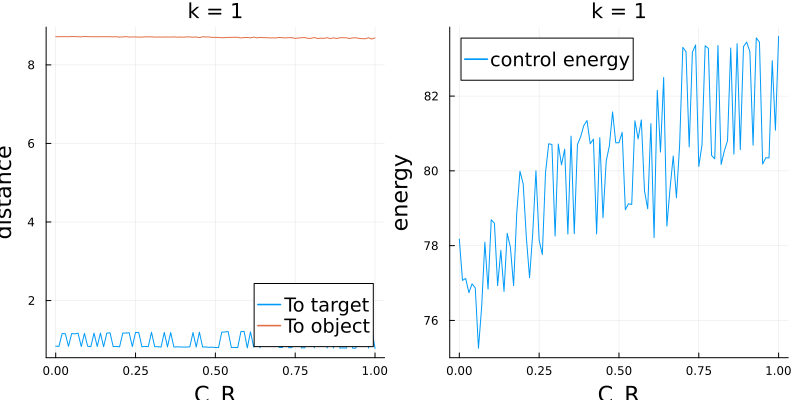

Progress: 100%|█████████████████████████████████████████| Time: 0:01:49


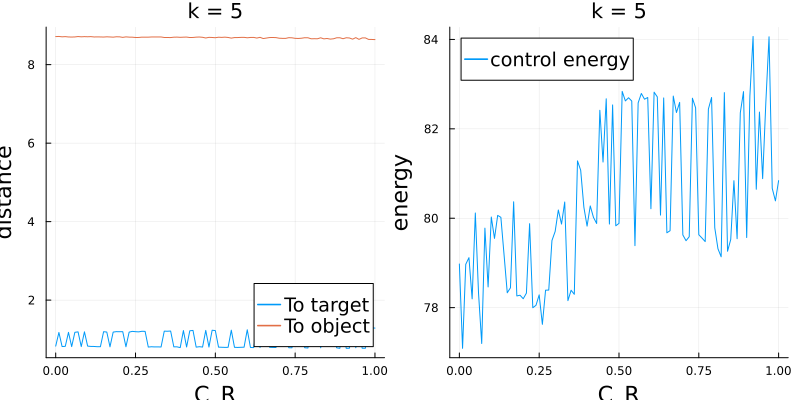

Progress: 100%|█████████████████████████████████████████| Time: 0:02:13


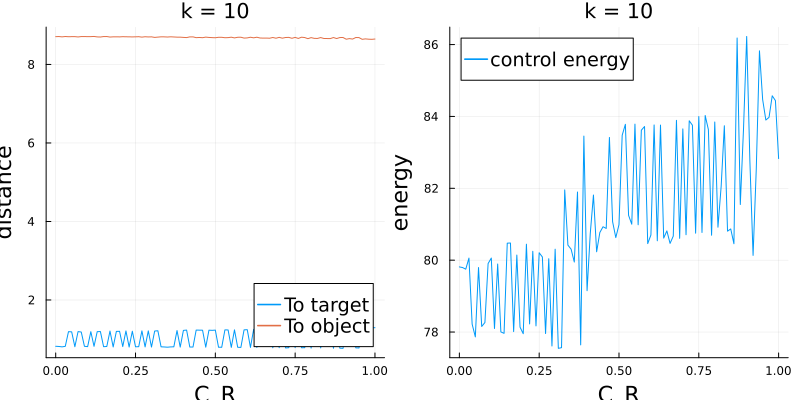

In [21]:
x0=[0.0;0.0;pi/2;0.0;0.0]

k_vals = [1,5,10]
Coll_Rad = 1
Coll_Sens = 0.01
Kx = 5.0
K = 1.5
ε = 10.0

cr_values = 0:0.01:1
nb_repetitions = 10

for val in k_vals
    
    av_min_distances_tgt = zeros(0)
    av_min_distances_obj = zeros(0)
    av_energy_of_control = zeros(0)

    k(t) = val
    @showprogress 1 for CR in cr_values
        min_distances_tgt = zeros(0)
        min_distances_obj = zeros(0)
        energy_of_control = zeros(0)

        p=(barv,vθ0,τ,barKvθ,obj,xt,CR,Coll_Sens,k,σx,σθ,Kx,K,ε)

        prob=SDEProblem(unicycle_full_exc!,σ_unicycle_full_exc!,x0,tspan,p)

        for r in nb_repetitions
            sol=solve(prob,EM(),dt=1e-4,saveat=0.001);

            distances = zeros(0)
            #distance to target
            for t_step in length(sol.t)

                distance = norm(sol[1:2,t_step] - tgttraj[t_step,:])
                push!(distances,distance)
            end
            push!(min_distances_tgt,(minimum(distances)))

            distances = zeros(0)
            #distance to object
            for t_step in length(sol.t)
                distance = norm(sol[1:2,t_step] - objtraj[t_step,:])
                push!(distances,distance)
            end
            push!(min_distances_obj,minimum(distances))

            #energy of control signal
            push!(energy_of_control, norm(sol[4,:]))
        end

        push!(av_min_distances_tgt,mean(min_distances_tgt))
        push!(av_min_distances_obj,mean(min_distances_obj))
        push!(av_energy_of_control,mean(energy_of_control))
    end

    p1 = plot(cr_values,[av_min_distances_tgt av_min_distances_obj],label = ["To target" "To object"], xlabel= "C_R",ylabel = "distance" )
    p2 = plot(cr_values,av_energy_of_control,label = "control energy", xlabel= "C_R",ylabel = "energy" )
    display(plot(p1,p2,size=(800,400), title = "k = $val"))
end

### Biffurcation diagrams for $C_R=0.1,0.25,0.5,1.0$, and $k=1.0,5.0,10.0$,

In [22]:
function fixed_controler!(du,u,p,t)
    ## differential eq problem where the dinamics are fixed to observe control output at fixed system values
    barv = p[1]

    vθ0 = p[2]

    τ = p[3]
    barKvθ = p[4]

    obj = p[5]
    xt = p[6]

    Coll_Rad = p[7]
    Coll_Sens = p[8]

    k = p[9]

    Kx = p[12]
    K = p[13]
    ε = p[14]
    c = p[15] ### Distance difference between object and unicycle as new parameter
    θao = p[16] ### angle as new parameter as it is fixed
    θat = p[17] ### angle as new parameter as it is fixed
    
    vθ=u[1]
    ks=u[2]
                    
    collision_alert = cos(θao)^2*10^(-(c-Coll_Rad))*(cos(θao)>0)

    impact_side = sign(sin(θao))

    Kvθ(collision_alert) = barKvθ*Coll_Sens/(collision_alert+Coll_Sens)

    I = impact_side*collision_alert - Kvθ(collision_alert)*sin(θat) 

    kk = k*collision_alert

    du[1]=1/τ*( -vθ  + tanh( (kk-ks+Kx*vθ^2)*vθ + I ) )  
    du[2]=ε*((K*vθ)^4-ks)
    
end

function excitable_controller_bifurcation_diagram( CR = 0.1, k = 0,θao = 0.001, θat = 0.0)
    
    function controller_at_eq(vθ,c)
        barKvθ = 1.0
        Kx = 5.0
        
        Coll_Sens = 0.01
        
        collision_alert = cos(θao)^2*10^(-(c-CR))*(cos(θao)>0)

        impact_side = sign(sin(θao))

        Kvθ(collision_alert) = barKvθ*Coll_Sens/(collision_alert+Coll_Sens)

        I = impact_side*collision_alert - Kvθ(collision_alert)*sin(θat) 

        kk = k*collision_alert
        ks = (K*vθ)^4 # value of d ks / dt = 0 when ks = (K*vθ)^4
        
        return -vθ  + tanh( (kk-ks+Kx*vθ^2)*vθ + I ) 
    end
    
    function find_limit_cycle(CR = 0.1, k_val = 0, dist = 0, θao = 0.001, θat = 0.0) ### define to find limit cycle
        barKvθ = 1.0
        Kx = 5.0
        Coll_Sens = 0.01
        barv = 0.1
        vθ0 = 0.5
        τ = 0.001
        K = 1.5
        ε = 10.0
        
        p=(barv,vθ0,τ,barKvθ,obj,xt,CR,Coll_Sens,k_val,0,0,Kx,K,ε,dist,θao,θat)
        
        function find_max_min_LC(voltage)
            threshold = 0.5
            
            # detect if threshold is crossed
            spike_start = findfirst(voltage .> 0.5 .|| voltage .< -0.5)
            if isnothing(spike_start)
                # no upstroke => no limit cycle
                return nothing
            end
            
            # detect if threshold is crossed again to dected saturation
            spike_end = findfirst(voltage[spike_start : end] .< 0.5 .&& voltage[spike_start : end] .> -0.5)
            if isnothing(spike_end)
                # saturation, no downstroke => no limit cycle
                return nothing
            end
            
            # there was a spike
            min_voltage = minimum(voltage[spike_start:end])
            max_voltage = maximum(voltage[spike_start:end])
            
            return (min_voltage, max_voltage)
        end
        Tfinal=200.
        tspan=(0.0,Tfinal)
        x0=[0.0;0.0]
        prob=ODEProblem(fixed_controler!,x0,tspan,p) # remove noise to find limi cycles
        sol=solve(prob,dt=1e-4,saveat=0.001);
        
        return find_max_min_LC(sol[1,:])
    end
    
    distance_vals = 0:0.01:4
    plt = scatter(4, xlims=(-0.1,4.1), ylims =(-1.1,1.1),label="" ,xlabel = "distance to object", ylabel = "vθ", title = "CR = $CR")

    for dist in distance_vals
        
        ## fixed points
        f = (x -> controller_at_eq(x, dist))
        fixed_pts = roots(f, -3..3)
        midpoints = mid.(interval.(fixed_pts))
        for i in midpoints
            scatter!([dist],[i],label="",mc="LightSkyBlue",markersize = 2,msw = 0)
        end
        
        ## LC
        values = find_limit_cycle(CR, k,dist)
        if isnothing(values)
            continue
        end
        min_v, max_v = values
        scatter!([dist],[min_v max_v], label="", mc="green", markersize = 2 , msw = 0)
    end
    return plt
end

excitable_controller_bifurcation_diagram (generic function with 5 methods)

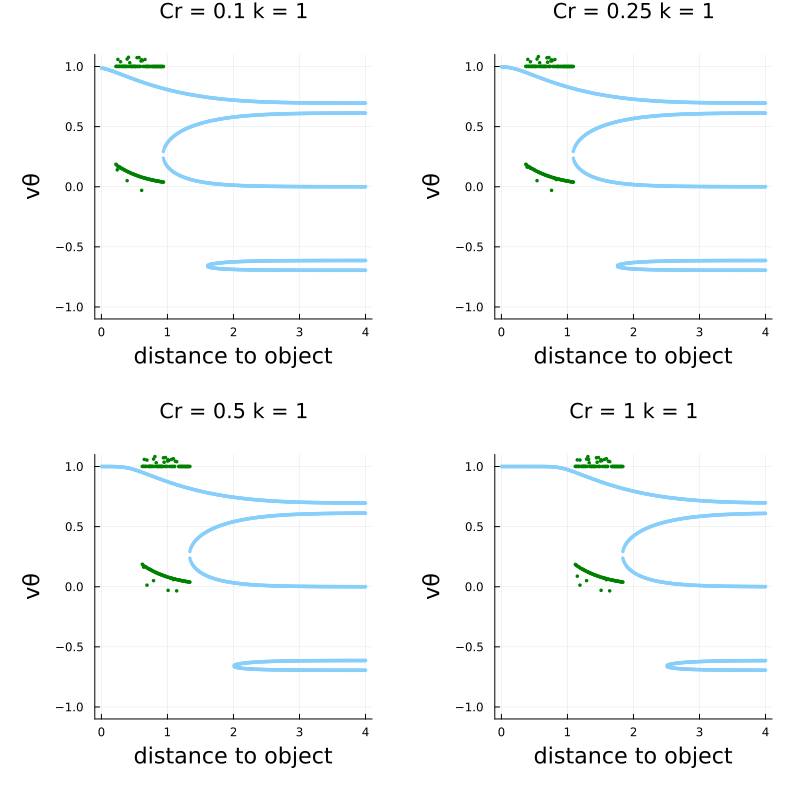

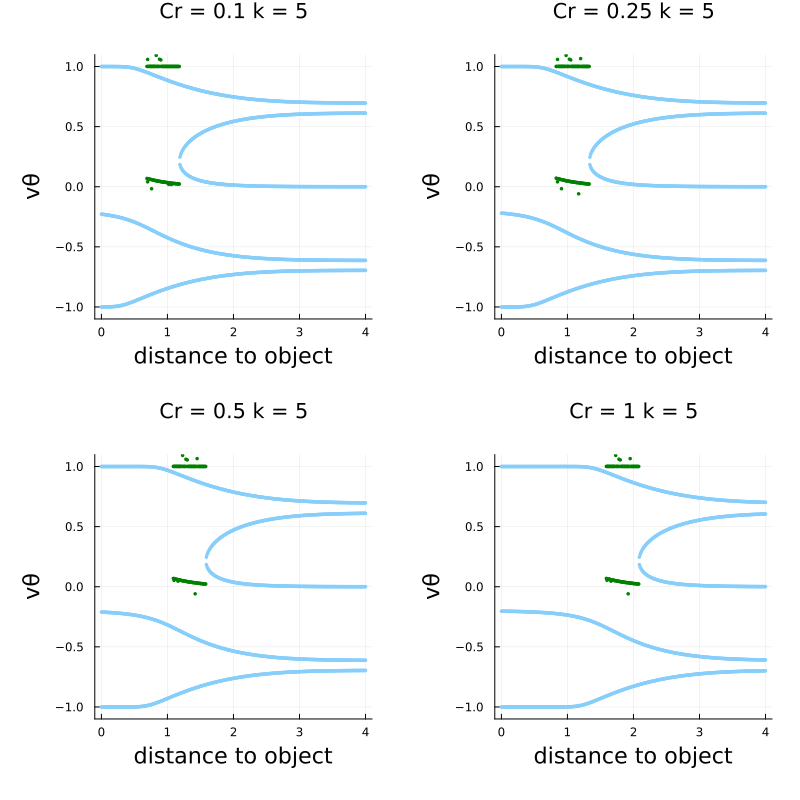

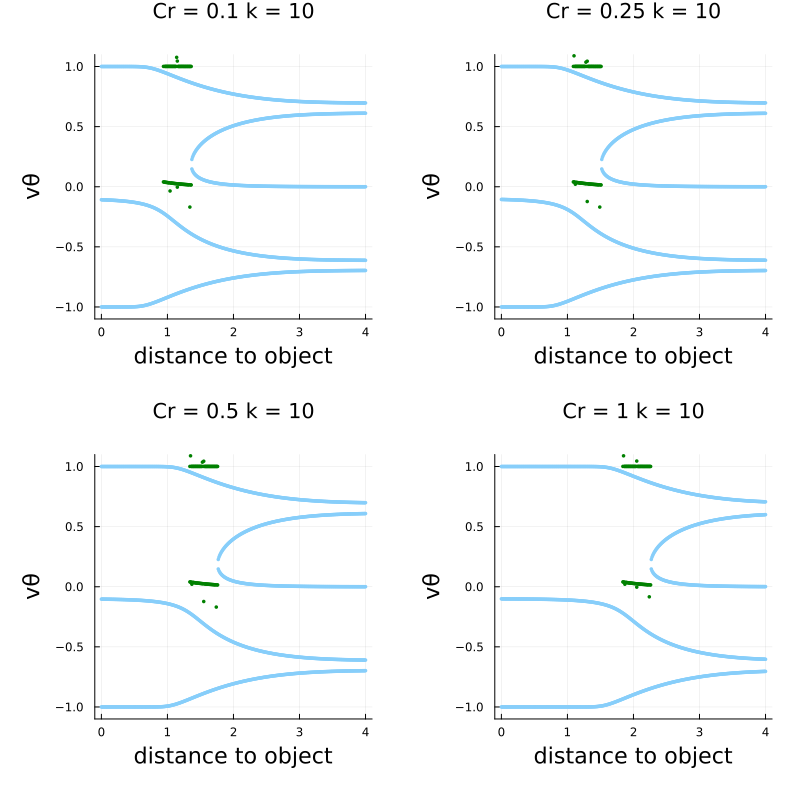

In [23]:
K_values  = [1, 5 , 10]
for val in K_values
    
    p1 = excitable_controller_bifurcation_diagram(0.1, val)
    title!("Cr = 0.1 k = $val")
    
    p2 = excitable_controller_bifurcation_diagram(0.25, val)
    title!("Cr = 0.25 k = $val")
    
    p3 = excitable_controller_bifurcation_diagram(0.5, val)
    title!("Cr = 0.5 k = $val")
    
    p4 = excitable_controller_bifurcation_diagram(1, val)
    title!("Cr = 1 k = $val")
    
    display(plot(p1,p2,p3,p4,size=(800,800),margin=20px))
end

### Phase planes 

𝜃𝑎𝑜=0.001, 𝜃𝑎𝑡=0, 𝐶𝑅=0.1,0.25,0.5,1.0, 𝑘=1.0,5.0,10.0, and all other parameters as above. Draw (𝑘𝑠,𝑣𝜃) phase planes for representative values of ‖𝐱−𝐱𝐨𝐛𝐣‖ and other paramters.

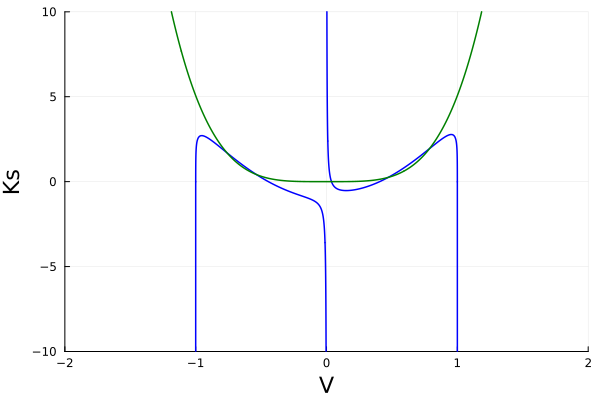

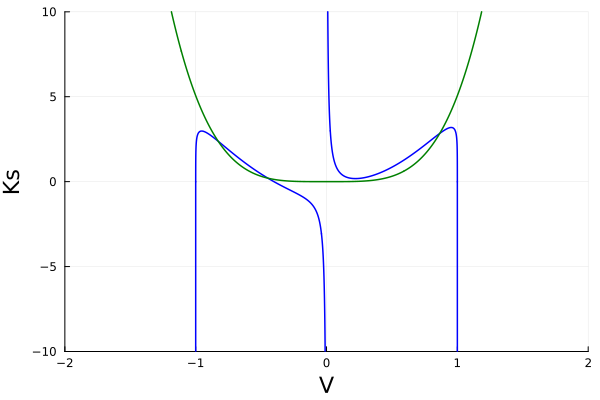

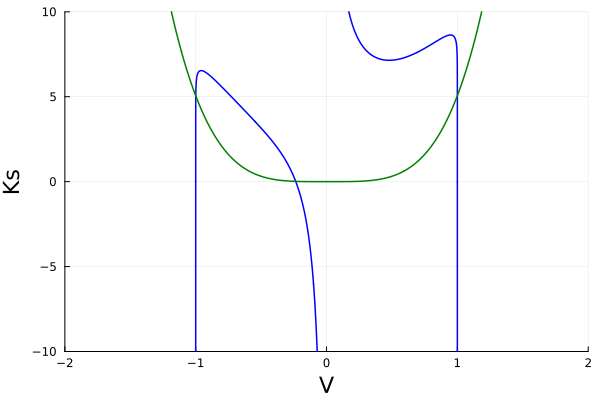

In [24]:
function phase_portrait(θao , c ,Coll_Rad , θat, k , K)

    ## Definition of nullclines functions
    function V_fast(vθ, ks)
        barKvθ = 1.0
        τ = 0.001
        Kx = 5.0
        Coll_Sens = 0.01
        collision_alert = cos(θao)^2*10^(-(c-Coll_Rad))*(cos(θao)>0)

        impact_side = sign(sin(θao))

        Kvθ(collision_alert) = barKvθ*Coll_Sens/(collision_alert+Coll_Sens)

        I = impact_side*collision_alert - Kvθ(collision_alert)*sin(θat) 

        kk = k*collision_alert
        
        return 1/τ*(-vθ  + tanh( (kk-ks+Kx*vθ^2)*vθ + I ) )
    end
    
    function V_slow(vθ, ks)     
        ε = 10.0
        return ε*((K*vθ)^4-ks)
    end
    
    ## Phase portrait
    ## Definition of V, Vs vectors
    V = -2:0.01:2 # Range for V
    Kss = -10:0.01:10 # Range for Vs

    ## Generation of figures 
    p1 = contour(V,Kss,V_fast,levels=[0],linewidth=1.5,linecolor="blue",colorbar=false) # V_fast-nullcline (blue)
    contour!(V,Kss,V_slow,levels=[0],linewidth=1.5,linecolor="green",colorbar=false) # V_slow-nullcline (green)
    xlabel!("V")
    ylabel!("Ks")
    display(p1)
    
end
    
phase_portrait(0.001, 2.0, 0.5, 0, 5, 1.5) # object outside radius
phase_portrait(0.001, 1.5, 0.5, 0, 5, 1.5) # object just outside radius
phase_portrait(0.001, 0.5, 0.5, 0, 5, 1.5) # object at radius

### Performance analysis of excitable and non-excitable controller

The excitable controller is both the most efficient controller as well as the most effective one. As it can be seen in the energy of the control signal, it has a much lower enegy than the other controllers. In the minimum distance plots it both has a larger minimum distance with the obstancle and a smaller minimum distance with the target. This shows that it both avoids the obstancle and track the target better than the other controllers too.

In the biffurcations diagrams we can see how the controller shows 3 different levels of response to the difference of distance between the unicycle and the obstacle. Saturation when the obstacle is within the radius, spiking when the obstacle is close but outside the radius, and no spiking when the obstacle is too far. These 3 distinct responses and the nonlinearity between them makes for the fast and apropriate response of the unicycle towards the obstacle. 

Maximum control signal output is only required when the obstacle is inside the radius, outside the security radius the distance should have a proportional response to the distance. Finally, there should be no reposponse when the object is too far to be relevant. Then, the fast dynamics of the system rapidly switches between control responses depending on the distance.

This behaviour can also be seen in the phase portrait. When the distance is outside the radius the N-shaped fast(blue) nullcline intersects the the slow(green) nullcline creating a fixed point close to 0. As the system does not respond to this stimulus we can see that the fixed point is stable. With the second phase portrait the object is just outside the radius, the fixed point has disapeared leaving an unstable fixed point on the diagonal of the N-shaped nullcline. This shows the switch to the spiking response to a distance outside radius stimulus through a limit cycle around this new unstable fixed point. Further decreasing of the distance moves the unstable fixed point along the N-shaped nullcline until the fixed point becomes stable again on the N's right downstroke. In this last case the controller saturates and outputs the maximum control siganl to avoid the obstacle as fast as possible.

## Extra questions

### Quantify the spiking frequency as a function of the object distance



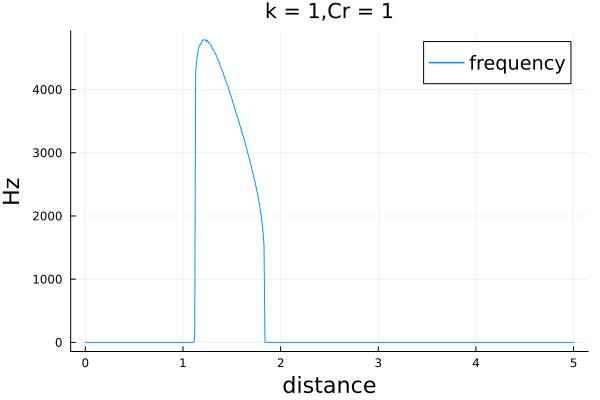

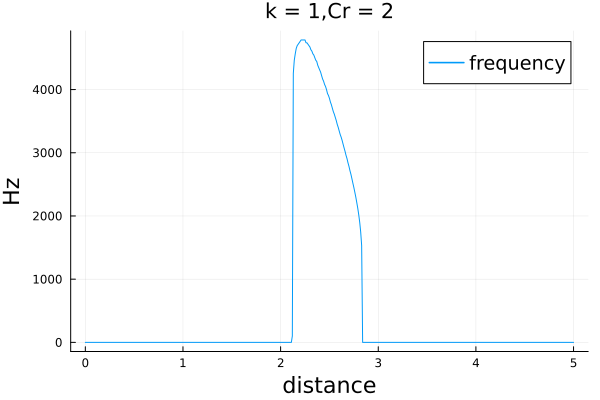

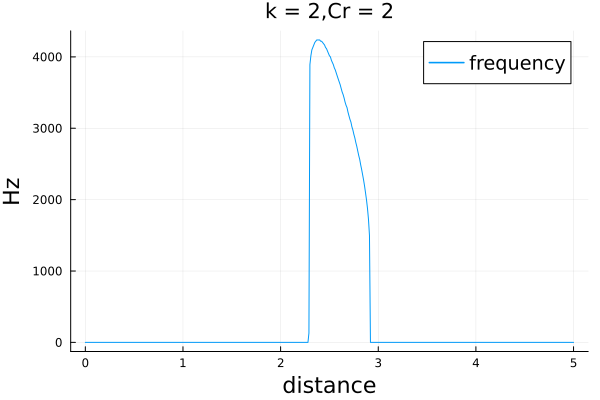

In [25]:
function compute_spike_frequency(V_range,dt)
    # we detect a spike with an above threshold values
    threshold = 0.3

    above_th = []
    above_th = V_range .> threshold .|| V_range .< -threshold

    # consider as spike the first value above threshhold
    prev_val = 0
    spikes = zeros(size(V_range))

    for i = 1:length(V_range)
        
        if (prev_val == 0 ) && (above_th[i] == 1)
            spikes[i] = 1 
        
        end
        prev_val = above_th[i]
    end

    spike_indexes = findall(!iszero, spikes)

    if size(spike_indexes)[1] < 2 
        # case where no spiking takes place
        return 0
    end

    time_interval = spike_indexes[size(spike_indexes)[1]] - spike_indexes[size(spike_indexes)[1]-1] # time interval of last spike

    f = 1/((time_interval * dt)/1000) # en Hz

    return f
end

function compute_FI_values(stimulation , k_val, cr)

    I = stimulation
    frequencies = zeros(size(I)[1])
    
    for i = 1:length(I)

        Tfinal=300.0
        tspan=(0.0,Tfinal)
        
        θao = 0.001
        θat = 0.0
        k = k_val
        barKvθ = 1.0
        Kx = 5.0
        Coll_Sens = 0.01
        Coll_Rad = cr
        barv = 0.1
        vθ0 = 0.5
        τ = 0.001
        K = 1.5
        ε = 10.0
        
        p=(barv,vθ0,τ,barKvθ,obj,xt,Coll_Rad,Coll_Sens,k,σx,σθ,Kx,K,ε,stimulation[i],θao,θat)
        x0=[0.0;0.0]
        prob=ODEProblem(fixed_controler!,x0,tspan,p) # remove noise to find limi cycles
        solving_dt = 0.001
        sol=solve(prob,dt=1e-4,saveat=solving_dt);

        frequencies[i] = compute_spike_frequency(sol[1,:], solving_dt )

    end

    return frequencies
end

distances = 0:0.01:5
freqs = compute_FI_values(distances,1,1)
display(plot(distances, freqs, label = "frequency", xlabel = "distance", ylabel = "Hz", title = "k = 1,Cr = 1"))
    
freqs = compute_FI_values(distances,1,2)
display(plot(distances, freqs, label = "frequency", xlabel = "distance", ylabel = "Hz", title = "k = 1,Cr = 2"))
    
freqs = compute_FI_values(distances,2,2)
display(plot(distances, freqs, label = "frequency", xlabel = "distance", ylabel = "Hz" , title = "k = 2,Cr = 2"))

### For all cases, propose ways (besides used control action and minimum distance to the object) to quantify the various controller performance (e.g., tracking error, trajectory curvature, etc.)

Average time to target

Difference between optimal path and used path. optimal path could be computed with an algorithm like A* on the discretized domain.

Maximum acceleration which is equivalent to maximum curvature in this case.

Variance over the paths a good controller should obtain similar control siganl in similar situation. (noise resiliance)

Succes rate of avoiding the obstacle and reaching the target from obstacles generated with random paths.